In [1]:
import cv2
from matplotlib import pyplot as plt

In [2]:
# Processing larger amount of frames since first 15 frames are not informative 
# due to relatively slow object motion speed
frames_amount = 250

def tracking(tracker):
    video = cv2.VideoCapture('../data/vase.mp4')
    # Object was detected in such coordinates
    x1, y1 = 448, 30
    x2, y2 = 463, 62
    width = x2 - x1
    height = y2 - y1
    bbox = (x1, y1, width, height)
    ret, frame = video.read()
    ok = tracker.init(frame, bbox)
    for i in range(frames_amount):
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ok, bbox = tracker.update(frame)
        x1, y1 = bbox[0], bbox[1]
        width, height = bbox[2], bbox[3]
        cv2.rectangle(frame, (x1, y1), (x1+width, y1+height), (255, 0, 0), 1)
        # Printing every 17th frame to reduce total images amount to 15
        if not i % 17:
            plt.imshow(frame)
        plt.show()   
        ret, frame = video.read()

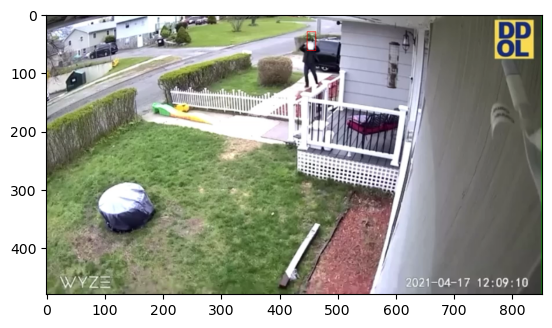

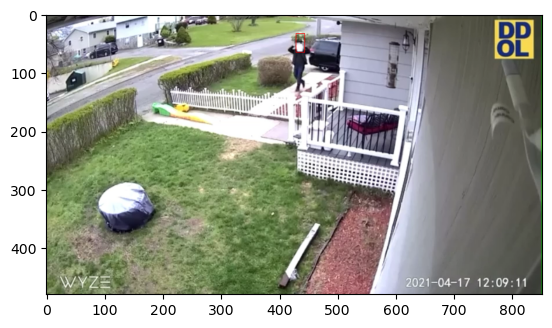

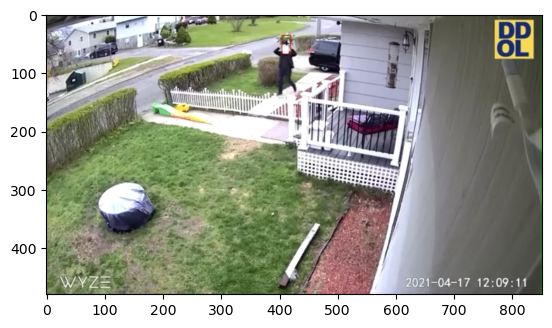

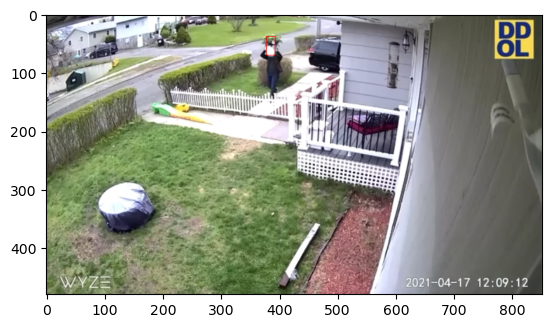

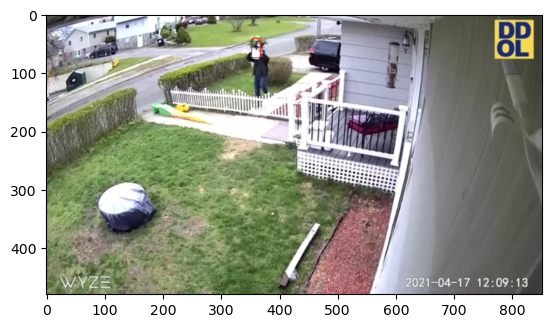

...

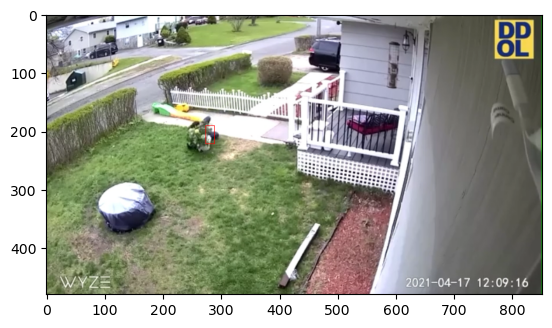

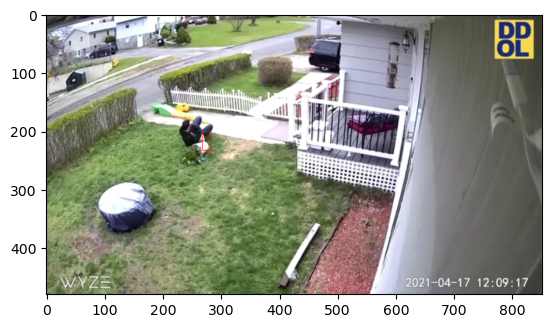

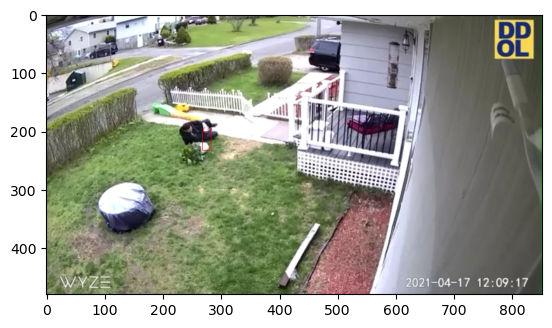

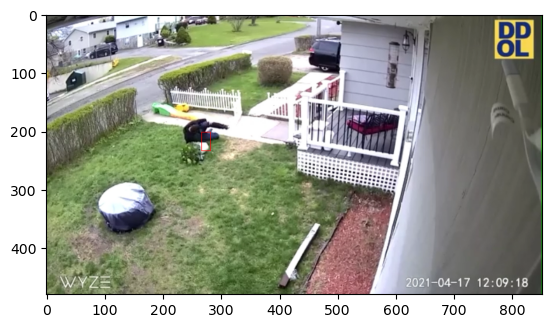

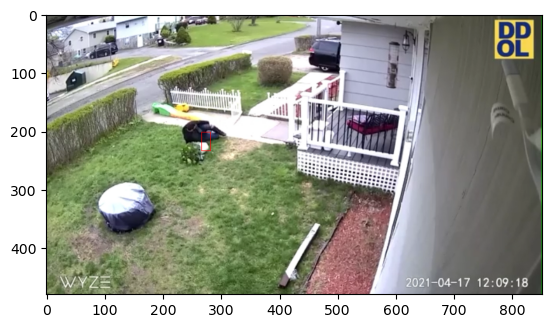

In [3]:
# Choosing CSRT tracker
tracker_csrt = cv2.TrackerCSRT_create()
tracking(tracker_csrt)

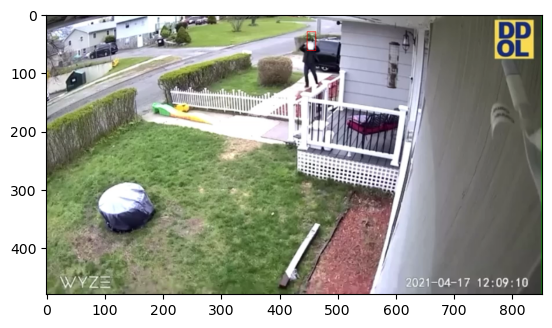

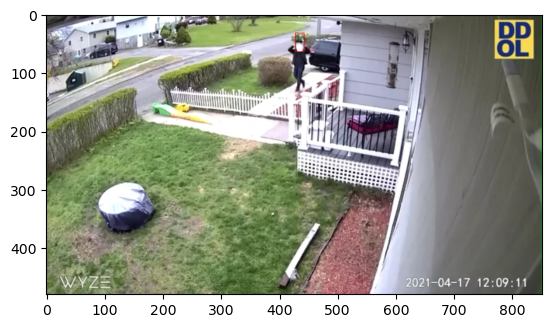

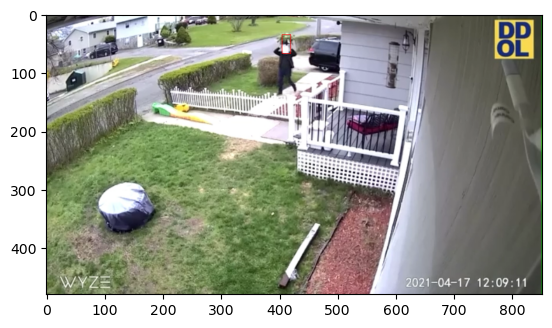

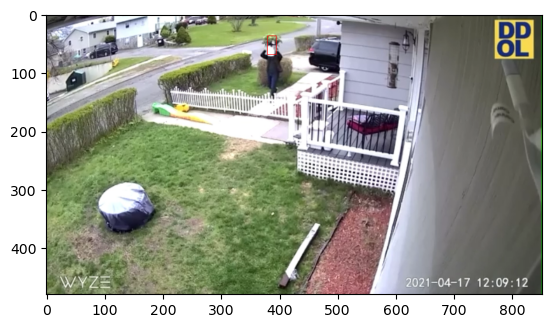

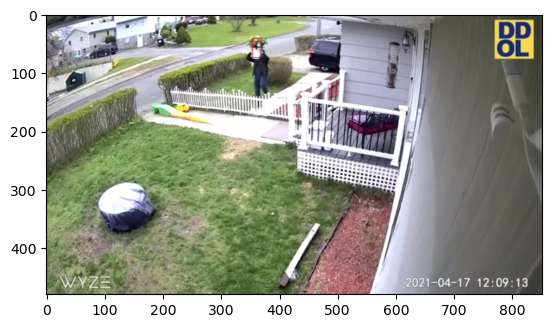

...

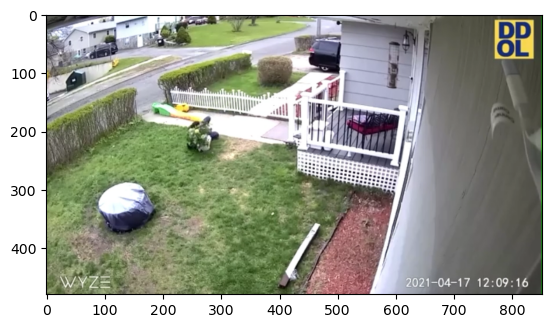

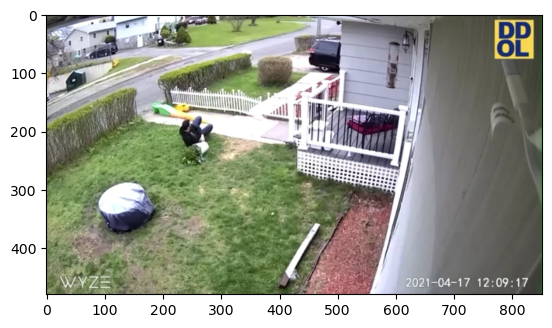

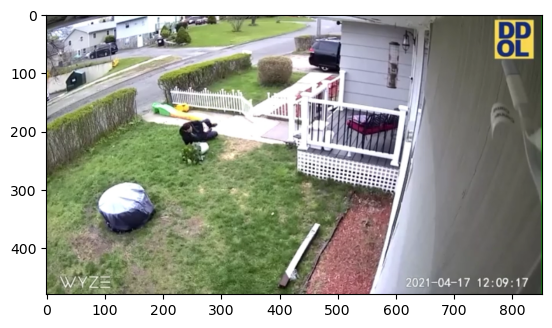

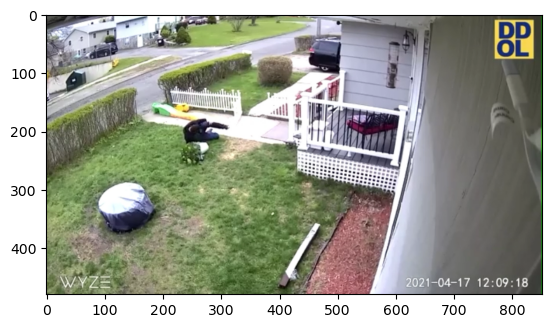

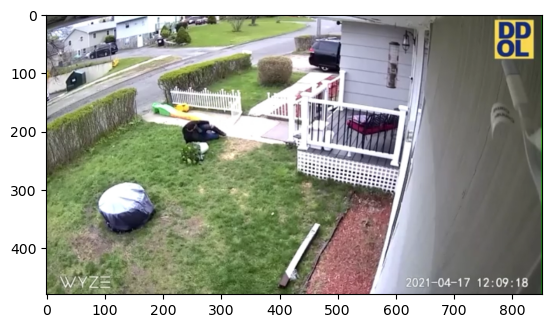

In [4]:
# Choosing KCF tracker
tracker_kcf = cv2.TrackerKCF_create()
tracking(tracker_kcf)

Do you see any differences? If so, what are they? \
At the beginning both trackers shown similar precision,\
But after target was partially covered KCF lost it, while \
CSRT was able to track the target with enough precision \
during extreme 250 frames even due it was partially covered and rotated

Does one tracker perform better than the other? In what way? \
CSRT performed much better due to great robustness even if it was slower than KCF